# COPPER

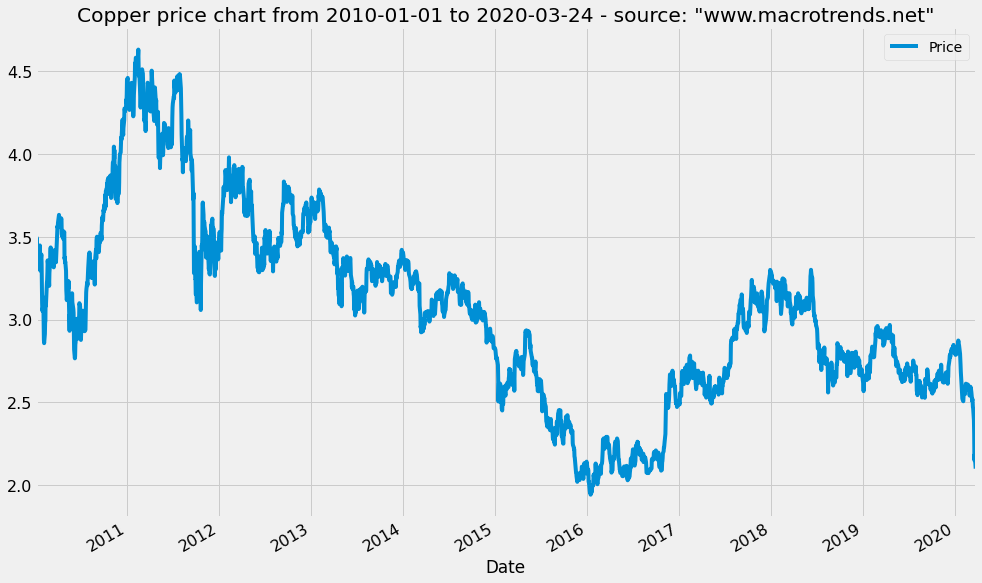

In [82]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math as math
import os
from fbprophet import Prophet
%matplotlib inline

# COPPER

#Put path to the folder with data source
os.chdir('C:/Users/Lukasz/Desktop/Analysis-and-forecast-of-stock-exchange-price-based-on-selected-indicators-using-machine-learning-master/data/azagorowski_data')

#Display options
pd.set_option('display.min_rows', 100)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)

#Import data, skip description rows, use columns: date & value
copper = pd.read_csv('copper-prices-historical-chart-data.csv',
                     skiprows=14,
                     usecols=['date',' value'])

#Convert column type to date time
copper["date"] = pd.to_datetime(copper["date"])

#Select price between 2010-01-01 and 2020-03-24
filter = (copper['date'] >= '2010-01-01') & (copper['date'] < '2020-03-24')
copper = copper[filter]

#Rename columns
copper = copper.rename(columns={'date': 'Date', ' value': 'Price'})

#Reset the index order
copper.index = copper['Date']
copper = copper.drop(columns=['Date'])

#Display Data Frame
copper.head()

## Copper price chart

plt.style.use('fivethirtyeight')
copper.plot(title="Copper price chart from 2010-01-01 to 2020-03-24 - source: \"www.macrotrends.net\"",
            figsize=(15,10),grid=True,fontsize=16)



# Copper Forecast with Prophet

In [83]:
#Reset index and creating of new date column
copper = copper.reset_index()

#Rename columns for prophet library
copper = copper.rename(columns={'Date': 'ds', 'Price': 'y'})

#Display Data Frame
copper.head()

,ds,y
0,2010-01-04,3.4060
1,2010-01-06,3.4945
2,2010-01-07,3.4270
3,2010-01-08,3.4005
4,2010-01-11,3.4410


In [84]:

#Instantiating a new Prophet object
m = Prophet(daily_seasonality=True)

#Call object's fit method and pass in the historical dataframe
m.fit(copper)

In [85]:
#Extend the "ds" column with forecast
future = m.make_future_dataframe(freq='D',periods=365)
future.tail()

,ds
2924,2021-03-19
2925,2021-03-20
2926,2021-03-21
2927,2021-03-22
2928,2021-03-23


In [86]:
#Assign predicted values
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2924,2021-03-19,2.350509,1.855417,2.873659
2925,2021-03-20,2.385038,1.871249,2.922700
2926,2021-03-21,2.385233,1.880525,2.917466
2927,2021-03-22,2.350618,1.862048,2.897337
2928,2021-03-23,2.352758,1.856916,2.915247


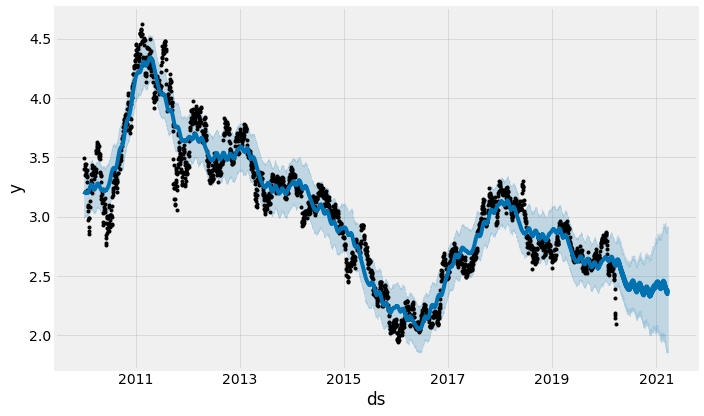

In [87]:
#Show a plot with the forecast
fig1 = m.plot(forecast)

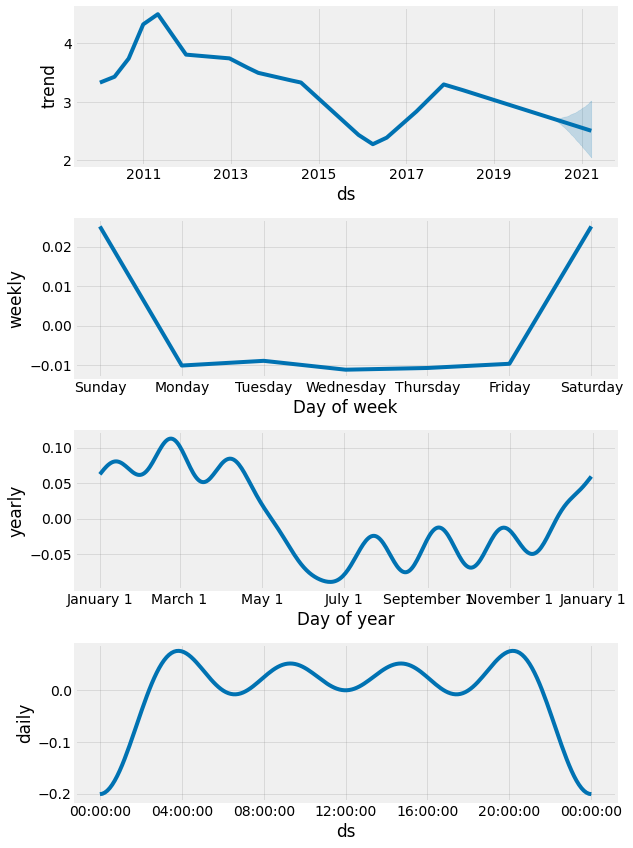

In [88]:
#Show a plot with components
fig2 = m.plot_components(forecast)

In [89]:
#Show interactive plot using plotly
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

#Add trendline to plot
fig = plot_plotly(m, forecast,trend=True)

#Update plot title, labels and other display options
fig.update_layout(
    title="Copper price forecast 2021 using Prophet - source: \"www.macrotrends.net\"",
    xaxis_title="Date",
    yaxis_title="Price",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="#242151"
    )
)
py.iplot(fig)

# CRUDE OIL PRICE

In [90]:
#Put path to the folder with data source
os.chdir('C:/Users/Lukasz/Desktop/Analysis-and-forecast-of-stock-exchange-price-based-on-selected-indicators-using-machine-learning-master/data/azagorowski_data')

#Put source file name
source = 'wti-crude-oil-prices-10-year-daily-chart.csv'

In [91]:
#Display options
pd.set_option('display.min_rows', 100)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)

In [92]:
#Import data, skip description rows, use columns: date & value
df = pd.read_csv(source, skiprows=14,
                     usecols=['date',' value'])

#Convert column type to date time
df["date"] = pd.to_datetime(df["date"])

#Select price between 2010-01-01 and 2020-03-24
filter = (df['date'] >= '2010-01-01') & (df['date'] < '2020-03-24')
df = df[filter]

#Rename columns
df = df.rename(columns={'date': 'Date', ' value': 'Price'})

#Reset the index order
df.index = df['Date']
df = df.drop(columns=['Date'])

#Display Data Frame
df.head()

,Price
Date,
2010-03-29,82.17
2010-03-30,82.37
2010-03-31,83.76
2010-04-01,84.87
2010-04-05,86.62


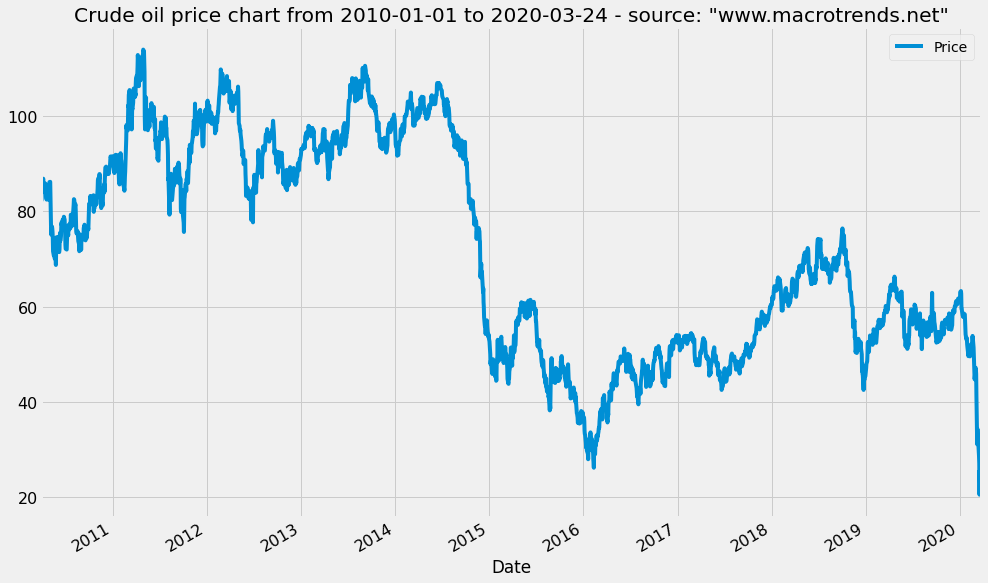

In [93]:
plt.style.use('fivethirtyeight')
df.plot(title="Crude oil price chart from 2010-01-01 to 2020-03-24 - source: \"www.macrotrends.net\"",
            figsize=(15,10),grid=True,fontsize=16)

In [94]:
#Reset index and creating of new date column
df = df.reset_index()

#Rename columns for prophet library
df = df.rename(columns={'Date': 'ds', 'Price': 'y'})

#Display Data Frame
df.head()

,ds,y
0,2010-03-29,82.17
1,2010-03-30,82.37
2,2010-03-31,83.76
3,2010-04-01,84.87
4,2010-04-05,86.62


In [95]:
#Import Prophet library
from fbprophet import Prophet

#Instantiating a new Prophet object
m = Prophet(weekly_seasonality=True,daily_seasonality=True)

#Call object's fit method and pass in the historical dataframe
m.fit(df)

In [96]:
#Extend the "ds" column with forecast
future = m.make_future_dataframe(freq='D',periods=365)
future.tail()

,ds
2877,2021-03-19
2878,2021-03-20
2879,2021-03-21
2880,2021-03-22
2881,2021-03-23


In [97]:
#Assign predicted values
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2877,2021-03-19,43.381425,28.330838,58.662362
2878,2021-03-20,44.975955,28.784574,59.894494
2879,2021-03-21,45.157086,29.450247,60.952459
2880,2021-03-22,43.878052,28.055666,59.568407
2881,2021-03-23,44.312272,28.416673,59.775346


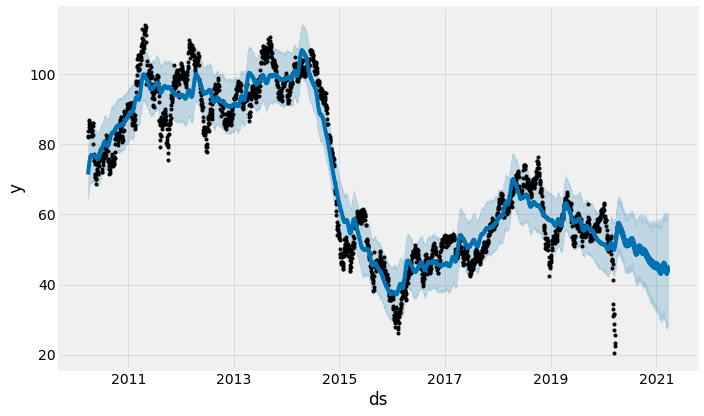

In [98]:
#Show a plot with the forecast
fig1 = m.plot(forecast)

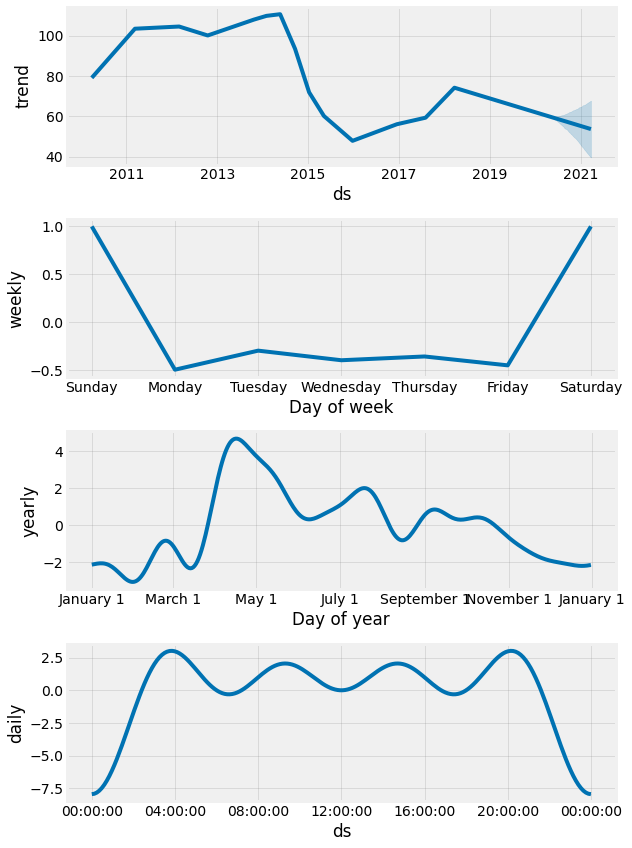

In [99]:
#Show a plot with components
fig2 = m.plot_components(forecast)

In [100]:
#Show interactive plot using plotly
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

#Add trendline to plot
fig = plot_plotly(m, forecast,trend=True)

#Update plot title, labels and other display options
fig.update_layout(
    title="Crude oil price forecast 2021 using Prophet - source: \"www.macrotrends.net\"",
    xaxis_title="Date",
    yaxis_title="Price",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="#242151"
    )
)
py.iplot(fig)

# Energy production from coal

In [101]:
#Display options
pd.set_option('display.min_rows', 100)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)

In [102]:
#Import data
energy_coal = pd.read_csv('global-primary-energy.csv',
                     usecols=['Year','Coal (terawatt-hours)'])

#Select TWh between 2010-01-01 and 2020-03-24
filter = (energy_coal['Year'] >= 2010) & (energy_coal['Year'] < 2020)
energy_coal = energy_coal[filter]

#Rename columns
energy_coal = energy_coal.rename(columns={'Year': 'Date', 'Coal (terawatt-hours)': 'Coal'})

#Change index column for "Date"
energy_coal.index = energy_coal['Date']

#Delete "Date" column that is not an index
energy_coal = energy_coal.drop(columns=['Date'])

#Display Data Frame
energy_coal.head(10)

,Coal
Date,
2010,41985.08246
2011,43990.61475
2012,44161.26699
2013,44973.42328
2014,44940.52703
2015,43832.91321
2016,43147.84934
2017,43245.45931
2018,43869.47664


# Energy production from coal chart

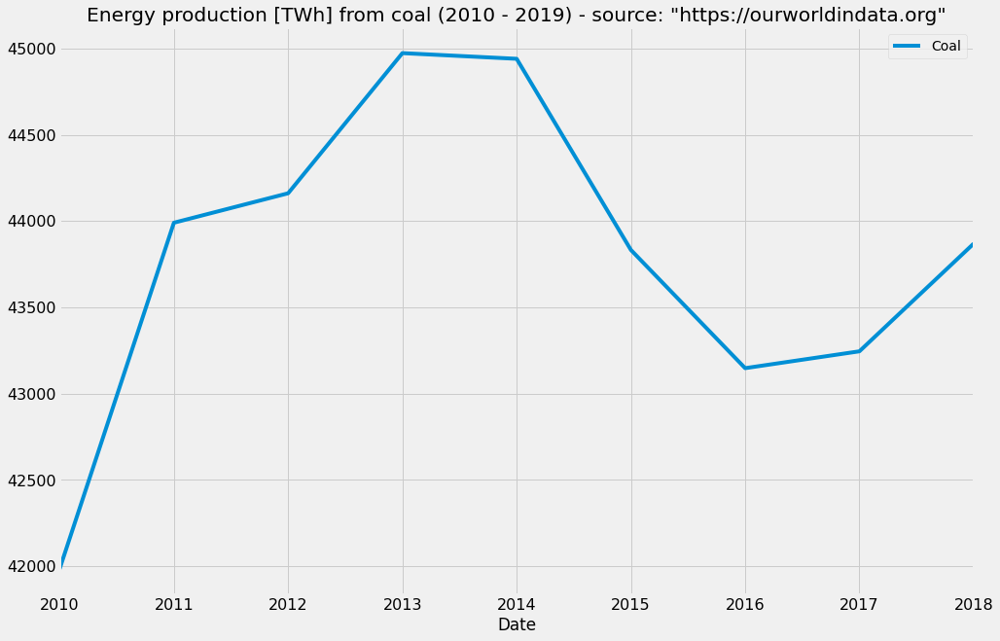

In [103]:
plt.style.use('fivethirtyeight')
energy_coal.plot(title="Energy production [TWh] from coal (2010 - 2019) - source: \"https://ourworldindata.org\"",
            figsize=(15,10),grid=True,fontsize=16)

# Energy production from crude oil and natural gas

In [104]:
#Import data
energy_oil_gas = pd.read_csv('global-primary-energy.csv',
                     usecols=['Year',
                              'Crude oil (terawatt-hours)',
                              'Natural gas (terawatt-hours)'])

#Select TWh between 2010-01-01 and 2020-03-24
filter = (energy_oil_gas['Year'] >= 2010) & (energy_oil_gas['Year'] < 2020)
energy_oil_gas = energy_oil_gas[filter]

#Rename columns
energy_oil_gas = energy_oil_gas.rename(columns={'Year': 'Date',
                                          'Crude oil (terawatt-hours)': 'Crude oil',
                                          'Natural gas (terawatt-hours)': 'Natural gas'})

#Change index column for "Date"
energy_oil_gas.index = energy_oil_gas['Date']

#Delete "Date" column that is not an index
energy_oil_gas = energy_oil_gas.drop(columns=['Date'])

#Display Data Frame
energy_oil_gas.head(10)

,Crude oil,Natural gas
Date,,
2010,48868.62035,31566.99647
2011,49376.97830,32333.01912
2012,49983.18506,33175.25407
2013,50594.42023,33697.55048
2014,51001.52584,33926.40425
2015,51936.74642,34664.70898
2016,52896.44423,35501.87446
2017,53579.46013,36540.20803
2018,54219.68079,38488.57083


# Energy production from crude oil and natural gas chart

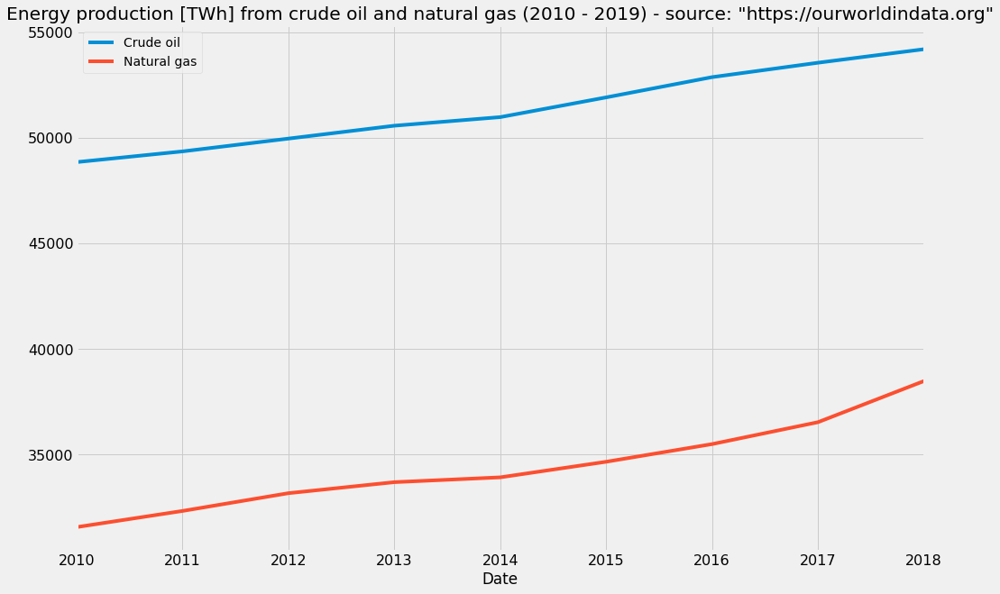

In [105]:
plt.style.use('fivethirtyeight')
energy_oil_gas.plot(title="Energy production [TWh] from crude oil and natural gas (2010 - 2019) - source: \"https://ourworldindata.org\"",
            figsize=(15,10),grid=True,fontsize=16)

# Industrial production index

In [106]:
#Display options
pd.set_option('display.min_rows', 100)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)

In [107]:
#Import data, skip description rows, use columns: date & value
industrial_production = pd.read_csv('industrial-production-historical-chart.csv',
                     skiprows=14,
                     usecols=['date',' value'])

#Convert column type to date time
industrial_production["date"] = pd.to_datetime(industrial_production["date"])

#Select price between 2010-01-01 and 2020-03-24
filter = (industrial_production['date'] >= '2010-01-01') & (industrial_production['date'] < '2020-03-25')
industrial_production = industrial_production[filter]

#Rename columns
industrial_production = industrial_production.rename(columns={'date': 'Date', ' value': 'Index'})

#Change index column for "Date"
industrial_production.index = industrial_production['Date']

#Delete "Date" column that is not an index
industrial_production = industrial_production.drop(columns=['Date'])

#Display Data Frame
industrial_production.head()

,Index
Date,
2010-01-01,91.685
2010-02-01,92.007
2010-03-01,92.610
2010-04-01,92.960
2010-05-01,94.299


# Industrial production index chart

In [108]:
pd.plotting.register_matplotlib_converters()

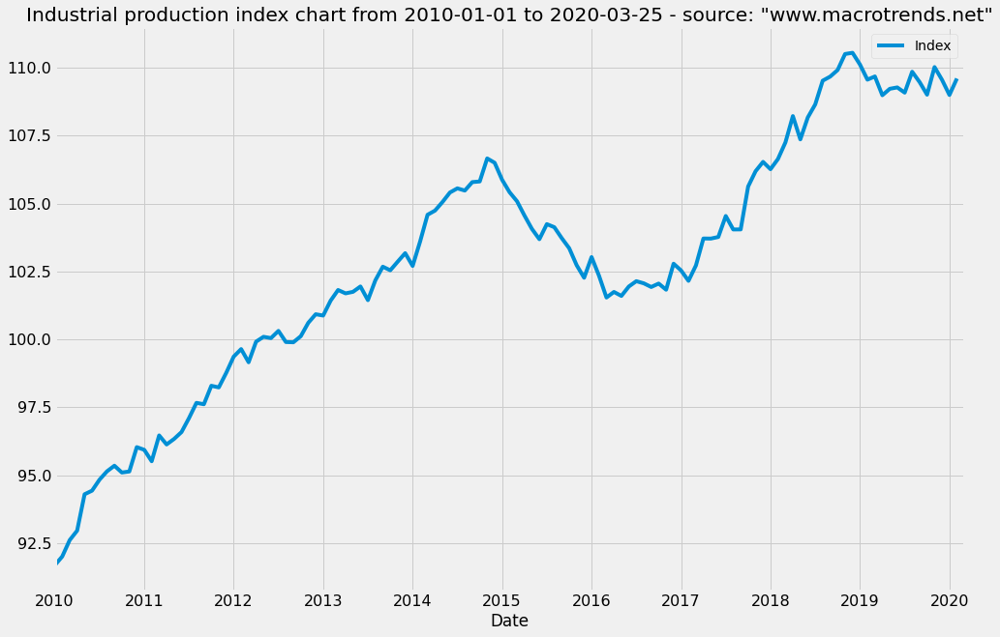

In [109]:
plt.style.use('fivethirtyeight')
industrial_production.plot(title="Industrial production index chart from 2010-01-01 to 2020-03-25 - source: \"www.macrotrends.net\"",
            figsize=(15,10),grid=True,fontsize=16)

# NATURAL GAS PRICE

In [110]:
#Display options
pd.set_option('display.min_rows', 100)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)

In [111]:
#Import data, skip description rows, use columns: date & value
df = pd.read_csv(source, skiprows=14,
                     usecols=['date',' value'])

#Convert column type to date time
df["date"] = pd.to_datetime(df["date"])

#Select price between 2010-01-01 and 2020-03-24
filter = (df['date'] >= '2010-01-01') & (df['date'] < '2020-03-24')
df = df[filter]

#Rename columns
df = df.rename(columns={'date': 'Date', ' value': 'Price'})

#Reset the index order
df.index = df['Date']
df = df.drop(columns=['Date'])

#Display Data Frame
df.head()

,Price
Date,
2010-03-29,82.17
2010-03-30,82.37
2010-03-31,83.76
2010-04-01,84.87
2010-04-05,86.62


# Natural gas price chart 

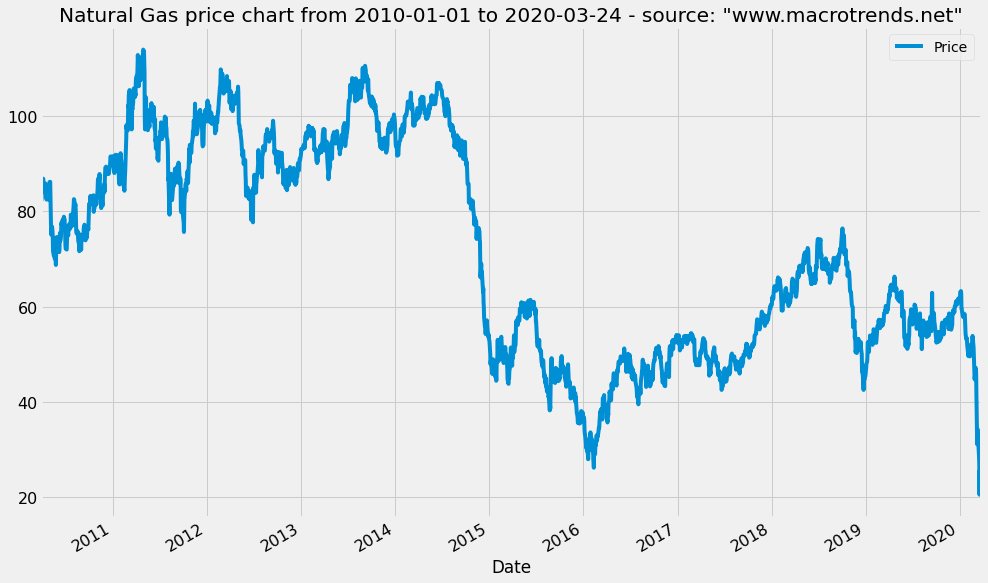

In [112]:
plt.style.use('fivethirtyeight')
df.plot(title="Natural Gas price chart from 2010-01-01 to 2020-03-24 - source: \"www.macrotrends.net\"",
            figsize=(15,10),grid=True,fontsize=16)

In [113]:
#Reset index and creating of new date column
df = df.reset_index()

#Rename columns for prophet library
df = df.rename(columns={'Date': 'ds', 'Price': 'y'})

#Display Data Frame
df.head()

,ds,y
0,2010-03-29,82.17
1,2010-03-30,82.37
2,2010-03-31,83.76
3,2010-04-01,84.87
4,2010-04-05,86.62


In [114]:
#Import Prophet library
from fbprophet import Prophet

#Instantiating a new Prophet object
m = Prophet(weekly_seasonality=True,daily_seasonality=False)

#Call object's fit method and pass in the historical dataframe
m.fit(df)

In [115]:
#Extend the "ds" column with forecast
future = m.make_future_dataframe(freq='M',periods=12)
future.tail()

,ds
2524,2020-10-31
2525,2020-11-30
2526,2020-12-31
2527,2021-01-31
2528,2021-02-28


In [116]:
#Assign predicted values
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2524,2020-10-31,53.278426,42.608673,62.560869
2525,2020-11-30,45.314229,35.297037,55.823348
2526,2020-12-31,44.619182,32.569193,55.641291
2527,2021-01-31,49.106321,36.640736,61.900464
2528,2021-02-28,50.641846,35.597990,64.742758


# Natural gas price chart with Prophet

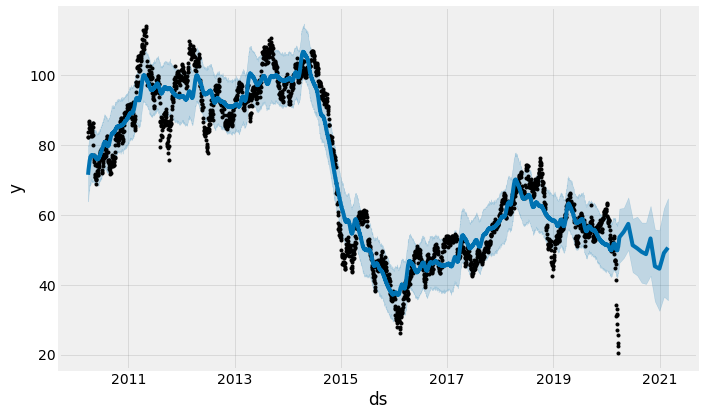

In [117]:
#Show a plot with the forecast
fig1 = m.plot(forecast)

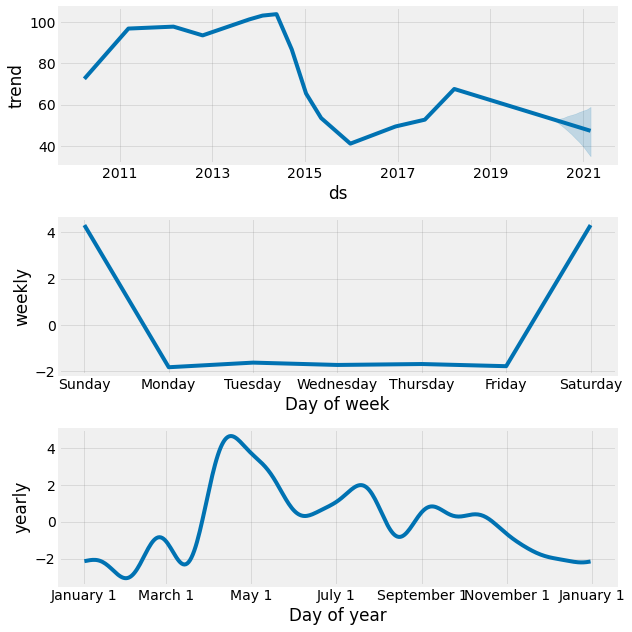

In [118]:
#Show a plot with components
fig2 = m.plot_components(forecast)

In [119]:
#Show interactive plot using plotly
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

#Add trendline to plot
fig = plot_plotly(m, forecast,trend=True)

#Update plot title, labels and other display options
fig.update_layout(
    title="Natural gas price forecast 2021 using Prophet - source: \"www.macrotrends.net\"",
    xaxis_title="Date",
    yaxis_title="Price",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="#242151"
    )
)
py.iplot(fig)

# PALLADIUM

In [120]:
#Display options
pd.set_option('display.min_rows', 100)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)

In [121]:
#Import data, skip description rows, use columns: date & value
df = pd.read_csv(source, skiprows=14,
                     usecols=['date',' value'])

#Convert column type to date time
df["date"] = pd.to_datetime(df["date"])

#Select price between 2010-01-01 and 2020-03-24
filter = (df['date'] >= '2010-01-01') & (df['date'] < '2020-03-24')
df = df[filter]

#Rename columns
df = df.rename(columns={'date': 'Date', ' value': 'Price'})

#Reset the index order
df.index = df['Date']
df = df.drop(columns=['Date'])

#Display Data Frame
df.head()

,Price
Date,
2010-03-29,82.17
2010-03-30,82.37
2010-03-31,83.76
2010-04-01,84.87
2010-04-05,86.62


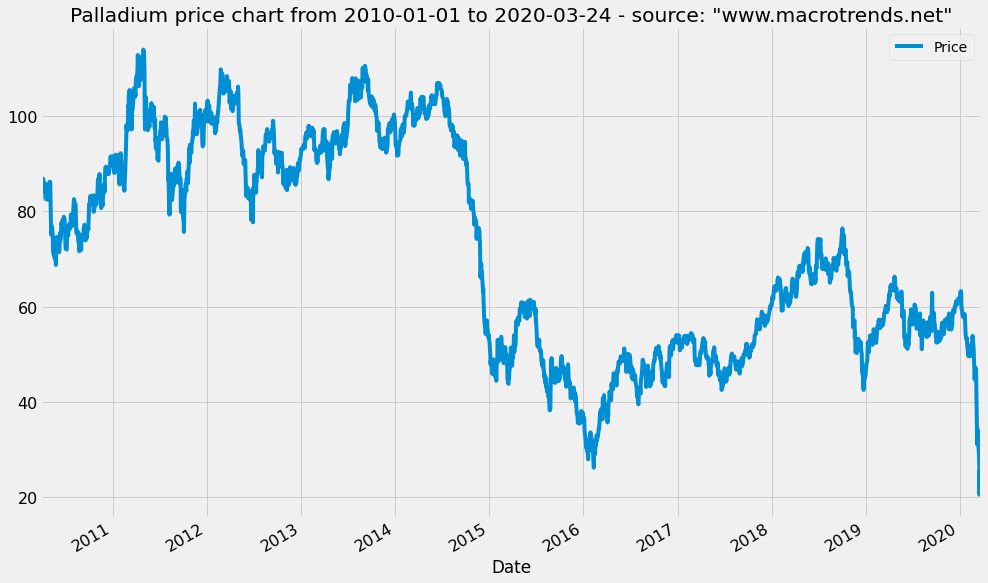

In [122]:
plt.style.use('fivethirtyeight')
df.plot(title="Palladium price chart from 2010-01-01 to 2020-03-24 - source: \"www.macrotrends.net\"",
            figsize=(15,10),grid=True,fontsize=16)

In [205]:
#Reset index and creating of new date column
df = df.reset_index()

#Rename columns for prophet library
df = df.rename(columns={'Date': 'ds', 'Price': 'y'})

#Display Data Frame
df.head()

ValueError: cannot insert level_0, already exists

In [124]:
#Import Prophet library
from fbprophet import Prophet

#Instantiating a new Prophet object
m = Prophet(daily_seasonality=True)

#Call object's fit method and pass in the historical dataframe
m.fit(df)

In [125]:
#Extend the "ds" column with forecast
future = m.make_future_dataframe(freq='D',periods=365)
future.tail()

,ds
2877,2021-03-19
2878,2021-03-20
2879,2021-03-21
2880,2021-03-22
2881,2021-03-23


In [81]:
#Assign predicted values
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2877,2021-03-19,43.381425,27.670147,59.797683
2878,2021-03-20,44.975955,30.863909,60.996576
2879,2021-03-21,45.157086,30.488803,61.708470
2880,2021-03-22,43.878052,29.185537,59.486403
2881,2021-03-23,44.312272,29.484445,60.682149


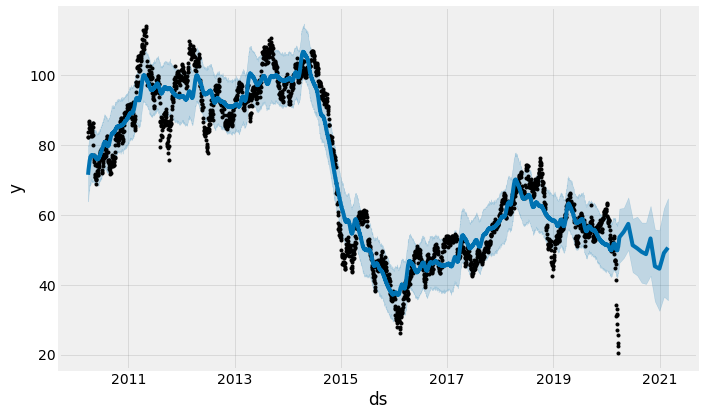

In [126]:
#Show a plot with the forecast
fig1 = m.plot(forecast)

In [ ]:
#Show a plot with components
fig2 = m.plot_components(forecast)

In [ ]:
#Show interactive plot using plotly
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

#Add trendline to plot
fig = plot_plotly(m, forecast,trend=True)

#Update plot title, labels and other display options
fig.update_layout(
    title="Palladium price forecast 2021 using Prophet - source: \"www.macrotrends.net\"",
    xaxis_title="Date",
    yaxis_title="Price",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="#242151"
    )
)
py.iplot(fig)

# PLATINUM

In [207]:
#Put source file name
source = 'platinum-prices-historical-chart-data.csv'

In [208]:
#Display options
pd.set_option('display.min_rows', 100)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)

In [209]:
#Import data, skip description rows, use columns: date & value
df1 = pd.read_csv(source, skiprows=14,
                     usecols=['date',' value'])

#Convert column type to date time
df1["date"] = pd.to_datetime(df1["date"])

#Select price between 2010-01-01 and 2020-03-24
filter = (df1['date'] >= '2010-01-01') & (df1['date'] < '2020-03-24')
df1 = df1[filter]

#Rename columns
df1 = df1.rename(columns={'date': 'Date', ' value': 'Price'})

#Reset the index order
df1.index = df1['Date']
df1 = df1.drop(columns=['Date'])

#Display Data Frame
df1.head()

,Price
Date,
2010-01-04,1523.9
2010-01-05,1537.8
2010-01-06,1558.4
2010-01-07,1559.4
2010-01-08,1570.6


# Platinum price chart

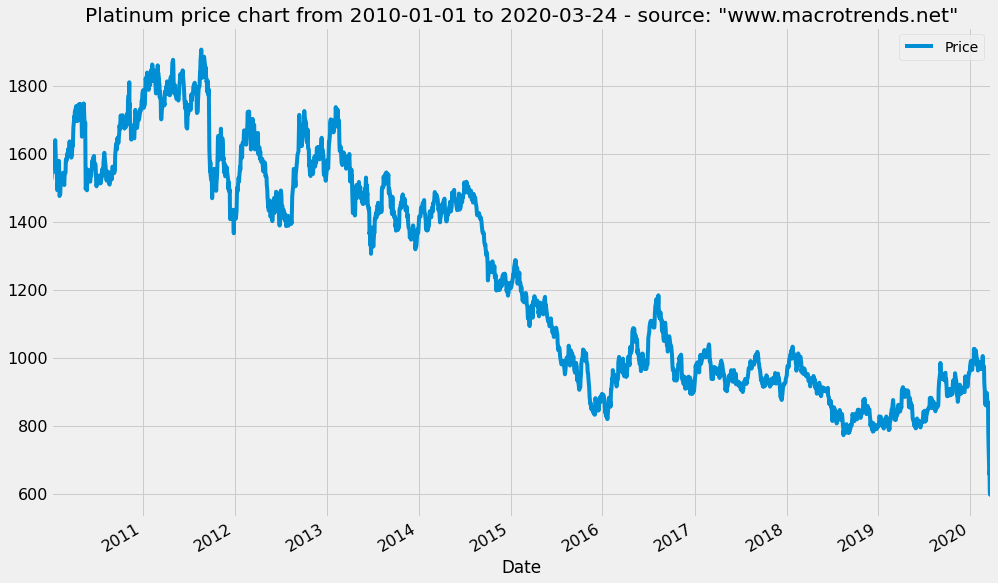

In [210]:
plt.style.use('fivethirtyeight')
df1.plot(title="Platinum price chart from 2010-01-01 to 2020-03-24 - source: \"www.macrotrends.net\"",
            figsize=(15,10),grid=True,fontsize=16)

In [211]:
#Reset index and creating of new date column

df1 = df1.reset_index()

#Rename columns for prophet library
df1 = df1.rename(columns={'Date': 'ds', 'Price': 'y'})

#Display Data Frame
df1.head()

,ds,y
0,2010-01-04,1523.9
1,2010-01-05,1537.8
2,2010-01-06,1558.4
3,2010-01-07,1559.4
4,2010-01-08,1570.6


In [213]:
#Import Prophet library
from fbprophet import Prophet

#Instantiating a new Prophet object
m = Prophet(daily_seasonality=True)

#Call object's fit method and pass in the historical dataframe
m.fit(df1)

In [216]:
#Extend the "ds" column with forecast
future = m.make_future_dataframe(freq='D',periods=365)
future.tail()

,ds
2934,2021-03-19
2935,2021-03-20
2936,2021-03-21
2937,2021-03-22
2938,2021-03-23


In [217]:
#Assign predicted values
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2934,2021-03-19,861.848654,690.523068,1042.862873
2935,2021-03-20,860.454406,688.048651,1055.890754
2936,2021-03-21,861.136731,690.622862,1051.423531
2937,2021-03-22,864.632203,683.145511,1058.142959
2938,2021-03-23,866.763681,689.197418,1055.464719


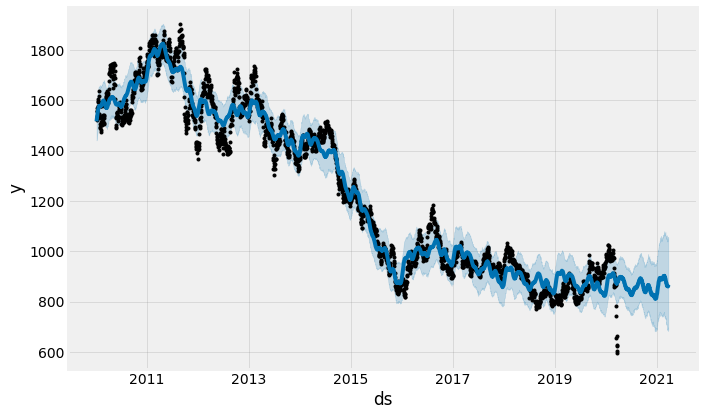

In [218]:
#Show a plot with the forecast
fig1 = m.plot(forecast)

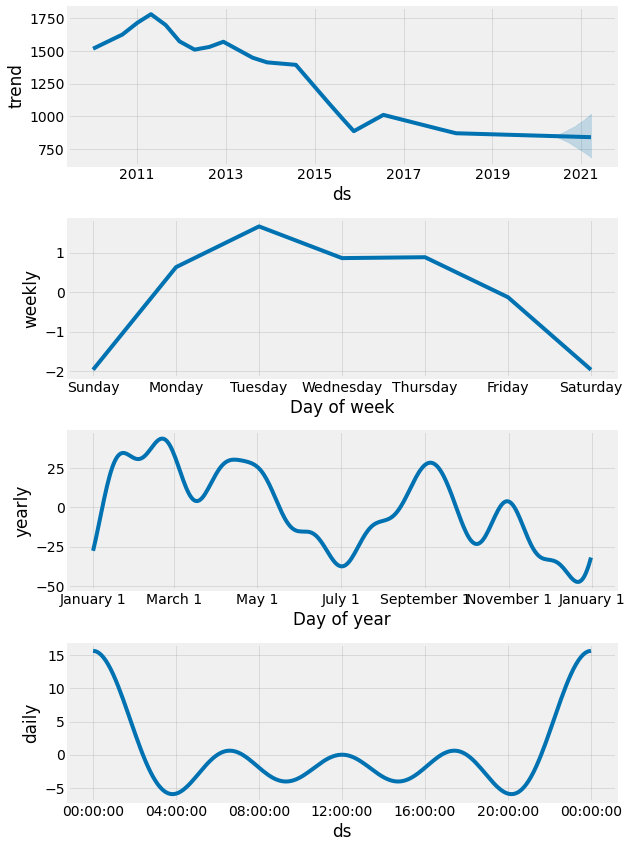

In [219]:
#Show a plot with components
fig2 = m.plot_components(forecast)

In [220]:
#Show interactive plot using plotly
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

#Add trendline to plot
fig = plot_plotly(m, forecast,trend=True)

#Update plot title, labels and other display options
fig.update_layout(
    title="Platinum price forecast 2021 using Prophet - source: \"www.macrotrends.net\"",
    xaxis_title="Date",
    yaxis_title="Price",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="#242151"
    )
)
py.iplot(fig)